In [1]:
from graphviz import Source
from IPython.display import Image
from google.colab import drive

drive.mount('/content/drive')
%cd /content/drive/Shareddrives/Data/밑바닥부터 시작하는 딥러닝

Mounted at /content/drive
/content/drive/Shareddrives/Data/밑바닥부터 시작하는 딥러닝


# Step 34

In [2]:
import numpy as np
from dezero import Variable as v
import dezero.functions as F

x = v(np.array(1.0))
y = F.sin(x)
y.backward(create_graph=True)

for i in range(3):
    gx = x.grad
    x.cleargrad()
    gx.backward(create_graph=True)
    print(x.grad)   # n차 미분

variable(-0.8414709848078965)
variable(-0.5403023058681398)
variable(0.8414709848078965)


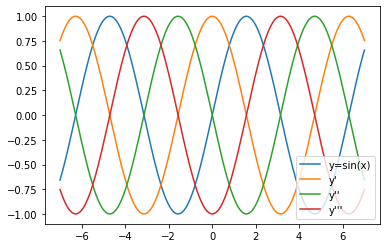

In [3]:
import matplotlib.pyplot as plt

x = v(np.linspace(-7, 7, 200))
y = F.sin(x)
y.backward(create_graph=True)

logs = [y.data]

for i in range(3):
    logs.append(x.grad.data)
    gx = x.grad
    x.cleargrad()
    gx.backward(create_graph=True)

labels = ["y=sin(x)", "y'", "y''", "y'''"]
for i , v in enumerate(logs):
    plt.plot(x.data, logs[i], label = labels[i])
plt.legend(loc='lower right')
plt.show()

# Step 35

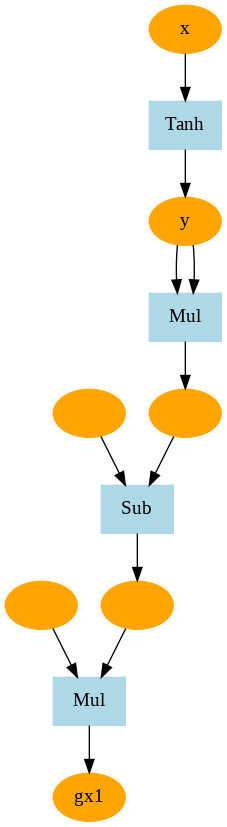

In [4]:
import numpy as np
from dezero import Variable as v
from dezero.utils import plot_dot_graph
import dezero.functions as F

x = v(np.array(1.0))
y = F.tanh(x)
x.name = 'x'
y.name = 'y'
y.backward(create_graph=True)

iters = 0   # iter = n 이면 n-1차 미분

for i in range(iters):
    gx = x.grad
    x.cleargrad()
    gx.backward(create_graph=True)

gx = x.grad
gx.name = 'gx' + str(iters+1)
plot_dot_graph(gx, verbose=False, filename='tanh')

In [6]:
x = v(np.array(1.0))
y = F.tanh(x)
x.name = 'x'
y.name = 'y'
y.backward(create_graph=True)

iters = 5   # iter = n 이면 n+1차 미분

for i in range(iters):
    gx = x.grad
    x.cleargrad()
    gx.backward(create_graph=True)

gx = x.grad
gx.name = 'gx' + str(iters+1)
plot_dot_graph(gx, verbose=False, filename="tanh4")

# Step 36

double backprop

In [13]:
from inspect import cleandoc
import numpy as np
from dezero import Variable as v

x = v(np.array(2.0))
y = x ** 2
y.backward(create_graph=True)
gx = x.grad     # 계산 그래프(식)
x.cleargrad()
print(gx)

z = gx ** 3 + y
z.backward()
print(x.grad)

variable(4.0)
variable(100.0)
